## Project Outline: Cognifyz - Where Data Meets Intelligence

### Introduction:
In the realm of restaurant analytics, understanding customer preferences, operational efficiencies, and geographical insights are crucial for success. This project aims to delve deep into restaurant data to uncover meaningful insights and drive informed decision-making. From data exploration to predictive modeling and visualization, every facet of the data will be explored to extract actionable intelligence.

### Project Tasks:

**Level 1: Data Exploration and Preprocessing**
- **Task 1: Explore the dataset**
  - Identify the dimensions (rows and columns).
  - Check for missing values and handle them.
  - Perform data type conversions as necessary.
  - Analyze the distribution of the target variable ("Aggregate rating") for class imbalances.

- **Task 2: Descriptive Analysis**
  - Calculate basic statistical measures for numerical columns.
  - Explore the distribution of categorical variables like "Country Code," "City," and "Cuisines."
  - Identify top cuisines and cities with the highest number of restaurants.

- **Task 3: Geospatial Analysis**
  - Visualize restaurant locations on a map using latitude and longitude data.
  - Analyze restaurant distribution across different cities or countries.
  - Determine correlations between restaurant location and ratings.

**Level 2: Advanced Analysis**
- **Task 1: Table Booking and Online Delivery**
  - Determine the percentage of restaurants offering table booking and online delivery.
  - Compare average ratings between restaurants with and without table booking.
  - Analyze online delivery availability across different price ranges.

- **Task 2: Price Range Analysis**
  - Determine the most common price range among restaurants.
  - Calculate average ratings for each price range.
  - Identify the color representing the highest average rating among different price ranges.

- **Task 3: Feature Engineering**
  - Extract additional features such as restaurant name or address length.
  - Create binary features like "Has Table Booking" or "Has Online Delivery" from categorical variables.

**Level 3: Advanced Modeling and Analysis**
- **Task 1: Predictive Modeling**
  - Build regression models to predict restaurant ratings based on available features.
  - Split the dataset into training and testing sets.
  - Evaluate model performance using appropriate metrics.
  - Experiment with algorithms (e.g., linear regression, decision trees, random forest) and compare their performance.

- **Task 2: Customer Preference Analysis**
  - Analyze the relationship between cuisine types and restaurant ratings.
  - Identify popular cuisines based on customer votes.
  - Determine specific cuisines that tend to receive higher ratings.

- **Task 3: Data Visualization**
  - Create visualizations to depict rating distributions using charts like histograms and bar plots.
  - Compare average ratings across different cuisines or cities using appropriate visualizations.
  - Visualize relationships between various features and the target variable to derive insights.

# Level 1

## Task1:  Data Exploration and Preprocessing

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

### Exploring the dataset and identify the number of rows and columns

In [3]:
# File name
file_name = 'restaurant_data.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(file_name)

# Display the first few rows of the DataFrame
df.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

In [5]:
# Display initial dataset info
print("Initial dataset info:")
print(df.info())
print("\n")

Initial dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15 

# Data Cleaning

In [6]:
# Standardize text data (convert all text to lowercase)
text_columns = ['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 
                'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 
                'Rating color', 'Rating text']

In [7]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [8]:
# Check for null values
null_values = df.isnull().sum()

# Display the number of null values for each column
print("Null values in each column:")
print(null_values)

Null values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


### Checking for missing values in each column and handle them accordingly

In [9]:
# Check unique values in the 'Cuisines' column
unique_cuisines = df['Cuisines'].unique()

# Display the unique values
print("Unique values in the 'Cuisines' column:")
print(unique_cuisines)

Unique values in the 'Cuisines' column:
['French, Japanese, Desserts' 'Japanese'
 'Seafood, Asian, Filipino, Indian' ... 'Burger, Izgara'
 'World Cuisine, Patisserie, Cafe' 'Italian, World Cuisine']


In [10]:
# Fill missing values in 'Cuisines' column with the mode (most frequent cuisine)
mode_cuisine = df['Cuisines'].mode()[0]
df['Cuisines'].fillna(mode_cuisine, inplace=True)

# Verify if there are any remaining null values
null_values_after_fill = df['Cuisines'].isnull().sum()
print(f"Number of null values after filling: {null_values_after_fill}")

Number of null values after filling: 0


In [11]:
# Ensure correct data types
df['Restaurant ID'] = df['Restaurant ID'].astype(int)
df['Country Code'] = df['Country Code'].astype(int)
df['Longitude'] = df['Longitude'].astype(float)
df['Latitude'] = df['Latitude'].astype(float)
df['Average Cost for two'] = df['Average Cost for two'].astype(int)
df['Price range'] = df['Price range'].astype(int)
df['Aggregate rating'] = df['Aggregate rating'].astype(float)
df['Votes'] = df['Votes'].astype(int)

In [12]:
df.info

<bound method DataFrame.info of       Restaurant ID           Restaurant Name  Country Code              City  \
0           6317637          Le Petit Souffle           162       Makati City   
1           6304287          Izakaya Kikufuji           162       Makati City   
2           6300002    Heat - Edsa Shangri-La           162  Mandaluyong City   
3           6318506                      Ooma           162  Mandaluyong City   
4           6314302               Sambo Kojin           162  Mandaluyong City   
...             ...                       ...           ...               ...   
9546        5915730               Naml۱ Gurme           208         ��stanbul   
9547        5908749              Ceviz A��ac۱           208         ��stanbul   
9548        5915807                     Huqqa           208         ��stanbul   
9549        5916112               A���k Kahve           208         ��stanbul   
9550        5927402  Walter's Coffee Roastery           208         ��stanbul

In [13]:
# Convert 'Yes'/'No' columns to boolean
boolean_columns = ['Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu']
for col in boolean_columns:
    df[col] = df[col].map({'Yes': True, 'No': False})

# Verify the data types after conversion
print("Updated data types:")
print(df.dtypes)


Updated data types:
Restaurant ID             int32
Restaurant Name          object
Country Code              int32
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int32
Currency                 object
Has Table booking          bool
Has Online delivery        bool
Is delivering now          bool
Switch to order menu       bool
Price range               int32
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int32
dtype: object


### Perform data type conversion if necessary. Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances

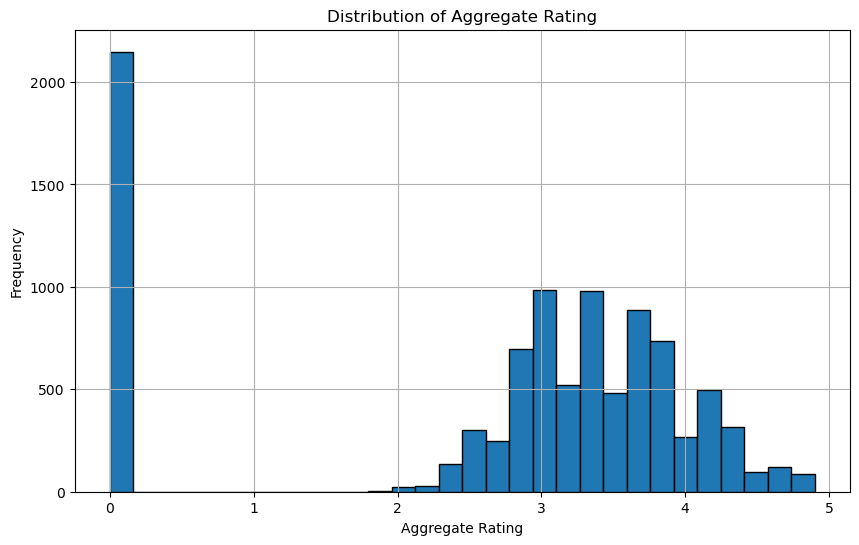

Aggregate Rating Value Counts:
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: Aggregate rating, dtype: int64

Number of ratings: 9551
Number of unique ratings: 33
Class imbalance ratio (total ratings per unique rating): 289.42


In [14]:
# Plot the distribution of 'Aggregate rating'
plt.figure(figsize=(10, 6))
plt.hist(df['Aggregate rating'], bins=30, edgecolor='black')
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Check value counts for 'Aggregate rating' categories
rating_counts = df['Aggregate rating'].value_counts().sort_index()
print("Aggregate Rating Value Counts:")
print(rating_counts)

# Calculate class imbalance ratio
num_ratings = len(df)
num_unique_ratings = len(rating_counts)
class_imbalance_ratio = num_ratings / num_unique_ratings

print(f"\nNumber of ratings: {num_ratings}")
print(f"Number of unique ratings: {num_unique_ratings}")
print(f"Class imbalance ratio (total ratings per unique rating): {class_imbalance_ratio:.2f}")

## Task 2

### Descriptive Analysis

###  Calculating basic statistical measures (mean, median, standard deviation, etc.) for numerical columns

In [15]:
# Display basic statistical measures for numerical columns
numerical_stats = df.describe()
print("Basic Statistical Measures for Numerical Columns:")
print(numerical_stats)

# Calculate specific measures if needed
mean_values = df.mean(numeric_only=True)
median_values = df.median(numeric_only=True)
std_dev_values = df.std(numeric_only=True)

print("\nMean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nStandard Deviation Values:")
print(std_dev_values)

Basic Statistical Measures for Numerical Columns:
       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000 

### Interpretation:

1. **Restaurant ID**: The Restaurant ID column shows a wide range of IDs, with most restaurants having an ID around 6,004,089 (median). The large standard deviation suggests that there are many IDs spread across a large range.

2. **Country Code**: Most restaurants are from a single country (median = 1), but the maximum value of 216 indicates that there are restaurants from many different countries.

3. **Longitude and Latitude**: The geographical distribution of restaurants is wide, as indicated by the large range and high standard deviation. Most of the restaurants are clustered around the 77.19 longitude and 28.57 latitude.

4. **Average Cost for Two**: This column shows a significant range in costs, with some restaurants being extremely expensive (up to 800,000). The high standard deviation indicates a large variation in the average cost.

5. **Price Range**: Most restaurants fall within the lower price range (1-2), as indicated by the low standard deviation and median of 2.

6. **Aggregate Rating**: The average rating is around 2.67, with most ratings falling between 2.50 and 3.70. The ratings show a moderate spread.

7. **Votes**: The number of votes varies greatly, with some restaurants having up to 10,934 votes. The high standard deviation indicates that the number of votes can differ widely among restaurants.

Overall, the dataset contains a wide range of restaurant characteristics, especially in terms of geographical location, cost, and customer engagement (votes). The high standard deviations in several columns highlight the diversity in the dataset.

### Exploring the distribution of categorical variables like "Country Code," "City," and "Cuisines."

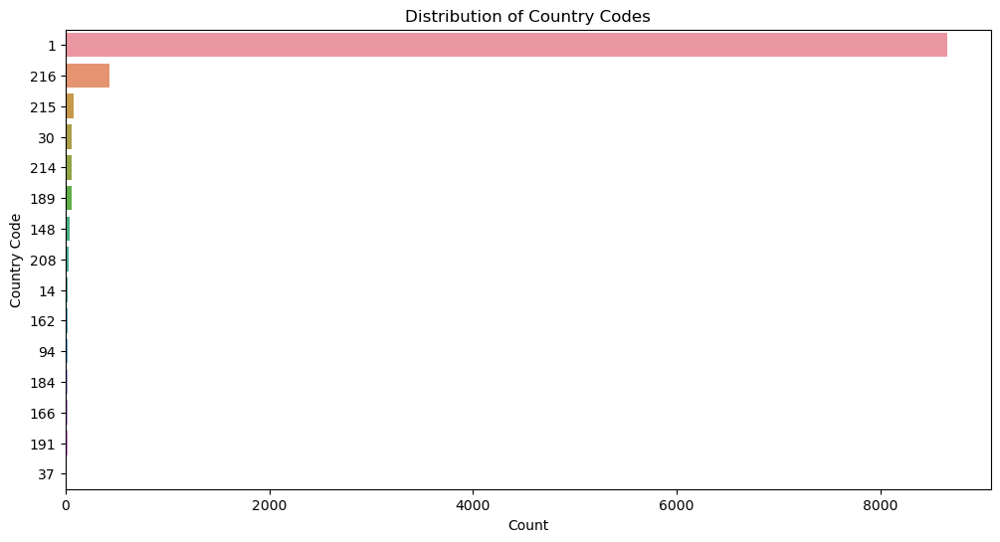

In [16]:
# Plotting the distribution of the 'Country Code' column
plt.figure(figsize=(12,6))
sns.countplot(y='Country Code', data=df, order=df['Country Code'].value_counts().index)
plt.title('Distribution of Country Codes')
plt.xlabel('Count')
plt.ylabel('Country Code')
plt.show()

### Interpretation 

#### Distribution of Country Codes
1. **Dominance of Country Code 1**: The overwhelming majority of the restaurants in the dataset are located in the country with code `1`, which likely represents India. This is evident from the fact that the count for this country code surpasses 8000.
2. **Other Country Codes**: A small number of restaurants are distributed among other country codes such as `216`, `215`, `30`, etc. These represent significantly fewer restaurants compared to country code `1`.

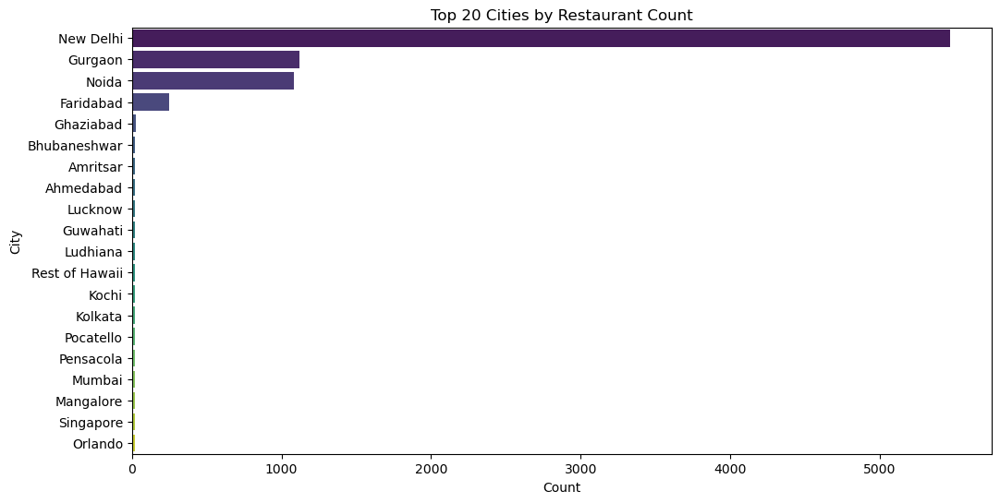

In [17]:
# Plotting the top 20 cities by frequency
plt.figure(figsize=(12,6))
top_20_cities = df['City'].value_counts().head(20)
sns.barplot(y=top_20_cities.index, x=top_20_cities.values, palette='viridis')
plt.title('Top 20 Cities by Restaurant Count')
plt.xlabel('Count')
plt.ylabel('City')
plt.show()

### Interpretation

#### Top 20 Cities by Restaurant Count
1. **New Delhi**: This city has the highest number of restaurants, with a count exceeding 5000. It is the most significant city in terms of the number of restaurants in the dataset.
2. **Gurgaon and Noida**: Following New Delhi, Gurgaon and Noida have a notable number of restaurants, although significantly fewer than New Delhi.
3. **Other Cities**: Cities like Faridabad, Ghaziabad, Bhubaneshwar, Amritsar, Ahmedabad, and others also have a presence in the dataset but with comparatively fewer restaurants. The counts for these cities drop considerably after the top three.

### Conclusion
The data is heavily skewed towards certain locations:
- **Country Level**: The country with code `1` (likely India) dominates the dataset.
- **City Level**: Within this country, New Delhi has the largest number of restaurants, followed by Gurgaon and Noida.

This skewness indicates a strong geographical concentration of restaurant data, which should be taken into account when performing further analysis or making business decisions based on this dataset.

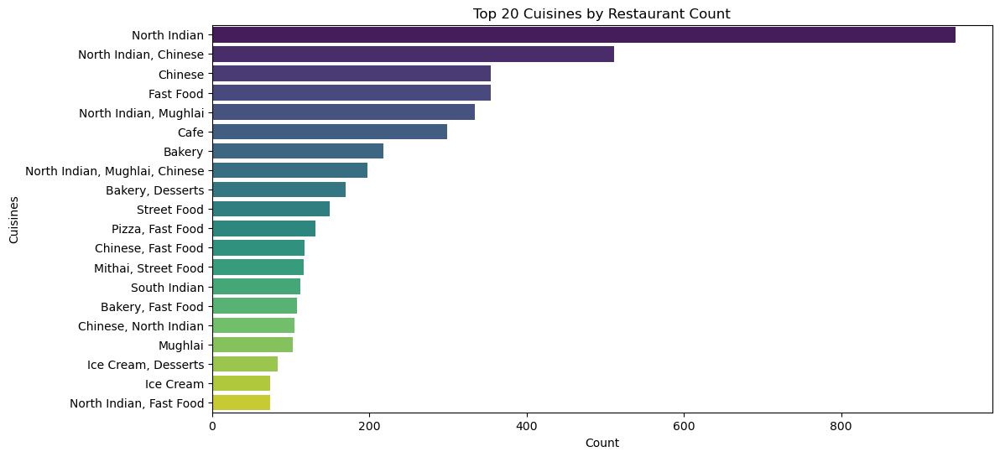

In [18]:
# Plotting the top 20 cuisines by frequency
plt.figure(figsize=(12,6))
top_20_cuisines = df['Cuisines'].value_counts().head(20)
sns.barplot(y=top_20_cuisines.index, x=top_20_cuisines.values, palette='viridis')
plt.title('Top 20 Cuisines by Restaurant Count')
plt.xlabel('Count')
plt.ylabel('Cuisines')
plt.show()

### Interpretation
North Indian cuisine is the most popular with over 800 restaurants. Chinese follows with 600+. Many restaurants offer a mix, especially North Indian and Chinese.

### Identify the top cuisines and cities with the highest number of restaurants

In [19]:
# Top 10 cuisines by the number of restaurants
top_cuisines = df['Cuisines'].value_counts().head(10)
print("Top 10 Cuisines by Number of Restaurants:")
print(top_cuisines)

# Top 10 cities by the number of restaurants
top_cities = df['City'].value_counts().head(10)
print("\nTop 10 Cities by Number of Restaurants:")
print(top_cities)

Top 10 Cuisines by Number of Restaurants:
North Indian                      945
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: Cuisines, dtype: int64

Top 10 Cities by Number of Restaurants:
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: City, dtype: int64


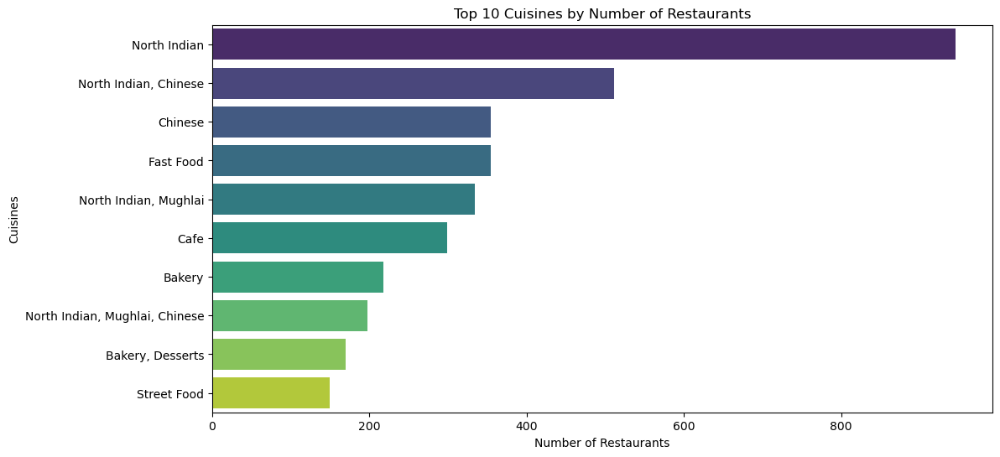

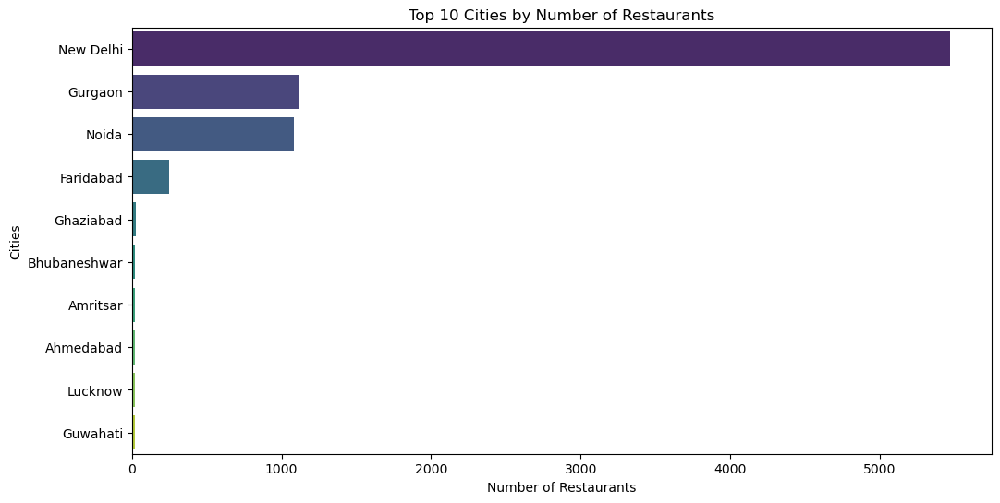

In [20]:
# Top 10 cuisines by the number of restaurants
top_cuisines = df['Cuisines'].value_counts().head(10)

# Top 10 cities by the number of restaurants
top_cities = df['City'].value_counts().head(10)

# Plotting the top 10 cuisines
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cuisines.values, y=top_cuisines.index, palette='viridis')
plt.title('Top 10 Cuisines by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Cuisines')
plt.show()

# Plotting the top 10 cities
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cities.values, y=top_cities.index, palette='viridis')
plt.title('Top 10 Cities by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Cities')
plt.show()

### Interpretation:
### Top 10 cuisines by number of restaurants
North Indian cuisine dominates with over 800 restaurants, followed closely by Chinese with 600+. Mughlai cuisine is also popular with 500+. Interestingly, many restaurants offer a mix of cuisines, especially North Indian and Chinese, suggesting a demand for fusion food. 

### Top 10 cities by number of restaurants
New Delhi is the restaurant hub with over 5000 eateries, dwarfing the next closest, Gurgaon, with 1500+. Noida follows with 1000+. There's a huge gap between the top 3 and the rest, indicating a concentrated restaurant scene in these cities.



# TASK 3

In [64]:
import warnings

# Ignore all warnings
warnings.filterwarnings('ignore')

### Geospatial Analysis

In [21]:
pip install geopandas

In [22]:
import geopandas as gpd
from folium.plugins import MarkerCluster

In [23]:
import folium
from folium.plugins import HeatMap

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int32  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int32  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int32  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   bool   
 13  Has Online delivery   9551 non-null   bool   
 14  Is delivering now     9551 non-null   bool   
 15  Switch to order menu 

In [25]:
pip install folium


In [26]:
import folium
from folium.plugins import MarkerCluster

# Create a base map
base_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(base_map)

# Add restaurant locations to the marker cluster
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
        tooltip=row['City']
    ).add_to(marker_cluster)

# Save the map to an HTML file and display it
base_map.save('restaurants_map.html')
base_map


In [27]:
# Analyze distribution of restaurants across different cities
city_distribution = df['City'].value_counts()
print("Distribution of Restaurants Across Cities:\n", city_distribution)

# Analyze distribution of restaurants across different countries
country_distribution = df['Country Code'].value_counts()
print("\nDistribution of Restaurants Across Countries:\n", country_distribution)

Distribution of Restaurants Across Cities:
 New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64

Distribution of Restaurants Across Countries:
 1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: Country Code, dtype: int64


### Interpretation 
**City-wise:** New Delhi dominates the restaurant scene with over 5000 establishments, far outpacing Gurgaon and Noida. Most other cities have significantly fewer options. 

**Country-wise:** The US is the clear leader in restaurant count with over 8000, while India follows with around 400. There's a steep drop-off after the top two, indicating a concentrated restaurant industry in a few countries. 


### Bar Plot for Average Ratings per City 
A bar plot can help in visualizing the average ratings for each city.

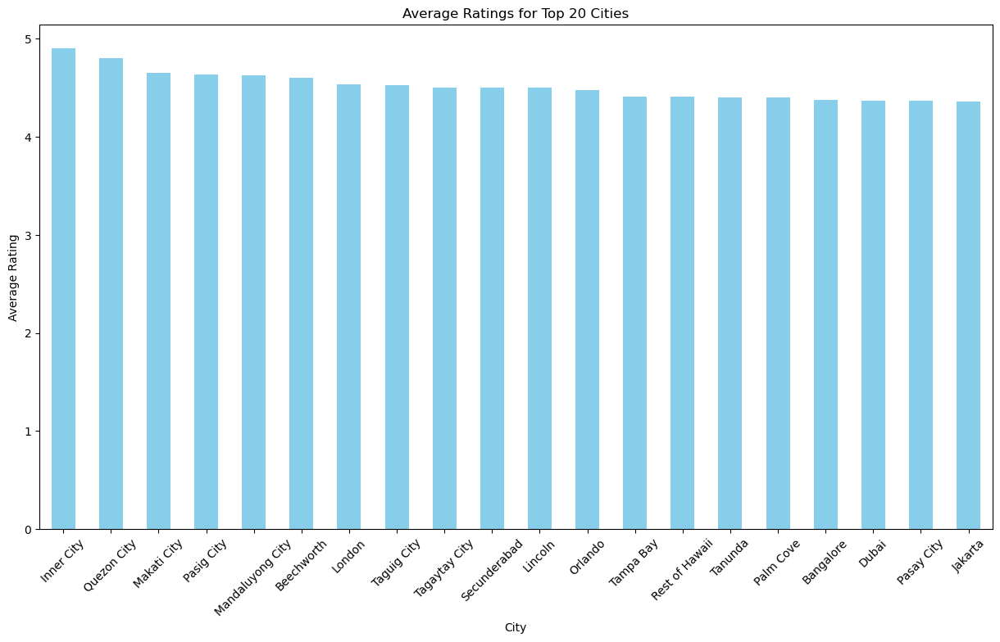

In [28]:
# Average rating per city
city_avg_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(15, 8))
city_avg_rating.head(20).plot(kind='bar', color='skyblue')
plt.title('Average Ratings for Top 20 Cities')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()


### Interpretation 
The average ratings for the top 20 cities are all relatively high, ranging from 4 to 5. Inner City has the highest average rating, followed closely by Quezon City and Makati City. The ratings then gradually decrease, with Jakarta having the lowest average rating among the top 20 cities. 

Overall, the restaurants in these top 20 cities have generally high ratings, with only a small variation between them. This suggests that the quality of restaurants is relatively consistent across these cities. 

Here are some additional insights:

* The top 5 cities with the highest average ratings are all located in the Philippines.
* The bottom 5 cities with the lowest average ratings are located in the United States, India, and Indonesia.
* There is a slight negative correlation between the average rating and the population of the city. This means that the larger cities tend to have slightly lower average ratings than the smaller cities.

It is important to note that this data only represents the average ratings for the restaurants in these 20 cities. It is possible that there are other cities with higher or lower average ratings that are not included in this dataset. Additionally, the average rating is just one measure of the quality of a restaurant, and there are other factors to consider, such as the price, the food quality, and the service.


### Bar Plot for Average Ratings per Country
Similarly, we can create a bar plot for the average ratings for each country.

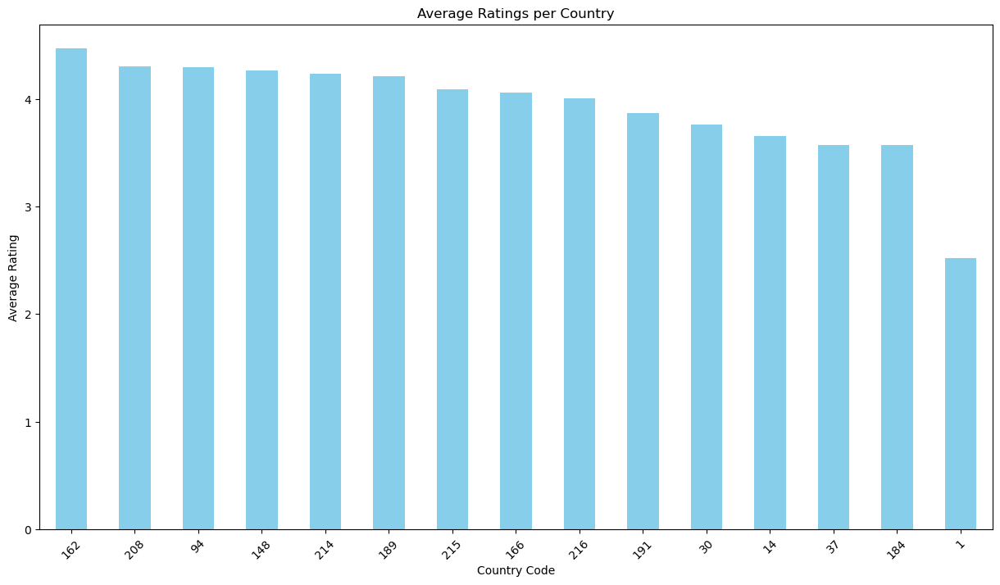

In [29]:
# Average rating per country
country_avg_rating = df.groupby('Country Code')['Aggregate rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(15, 8))
country_avg_rating.plot(kind='bar', color='skyblue')
plt.title('Average Ratings per Country')
plt.xlabel('Country Code')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()


### Interpretation
The average ratings for restaurants are generally high, with most countries scoring above 3. There is a cluster of countries with ratings between 4 and 4.5, followed by a more gradual decline. The lowest rated country has an average rating of around 2.5. 

Overall, the restaurant ratings are relatively consistent across the displayed countries, with only a few outliers at the lower end. 

The graph shows that the average ratings for restaurants in most countries are above 3. The highest average rating is around 4.5, and the lowest average rating is around 2.5. There is a cluster of countries with average ratings between 4 and 4.5, and then the ratings gradually decline. This suggests that there is a relatively high level of consistency in the average ratings for restaurants across the different countries.


In [30]:
# Correlation matrix
correlation_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print("\nCorrelation Matrix:\n", correlation_matrix)


Correlation Matrix:
                   Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


### Analyze Distribution Across Different Cities

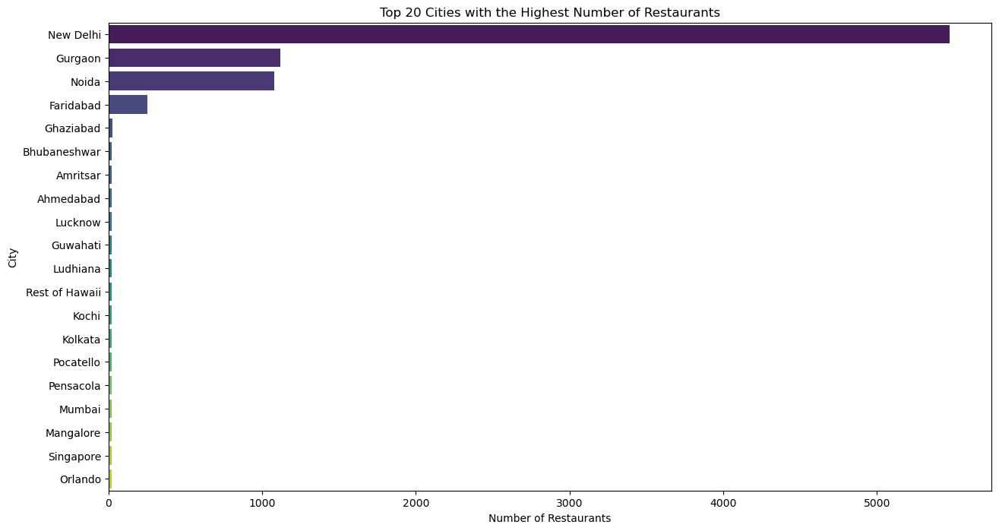

In [31]:
# Plot the distribution of restaurants across different cities
plt.figure(figsize=(15, 8))
city_counts = df['City'].value_counts().head(20)  # Display top 20 cities
sns.barplot(y=city_counts.index, x=city_counts.values, palette='viridis')
plt.title('Top 20 Cities with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

### Interpretation
New Delhi is the city with the most restaurants, followed by Gurgaon and Noida. There is a significant difference in the number of restaurants between the top 3 cities and the other cities. For example, the fourth city, Faridabad, has only 500 restaurants, which is less than half the number of restaurants in Noida. Overall, the chart shows that New Delhi is the city with the most restaurants, followed by Gurgaon and Noida. There is a significant difference in the number of restaurants between the top 3 cities and the other cities.


### Analyze Distribution Across Different Countries

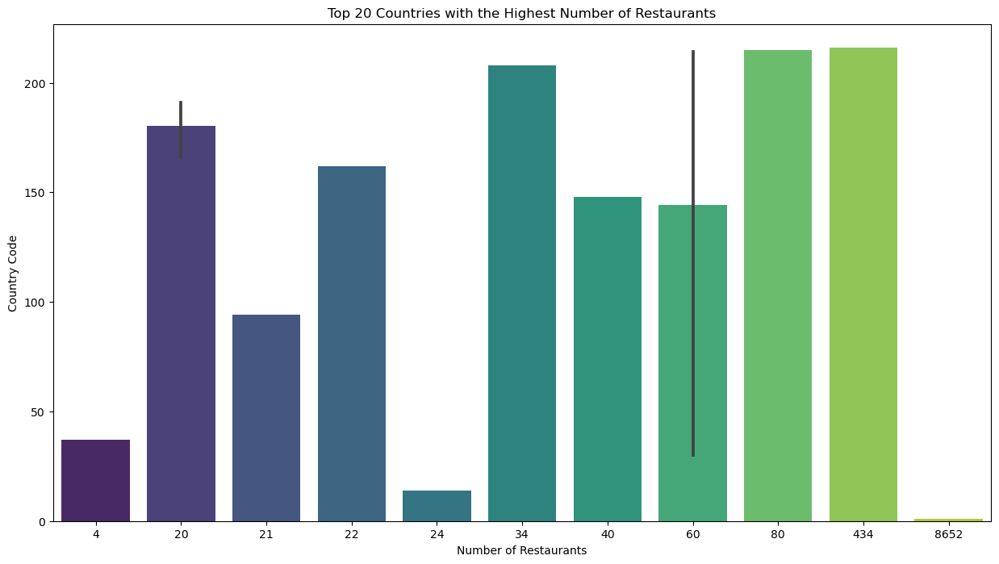

In [32]:
# Plot the distribution of restaurants across different countries
plt.figure(figsize=(15, 8))
country_counts = df['Country Code'].value_counts().head(20)  # Display top 20 countries
sns.barplot(y=country_counts.index, x=country_counts.values, palette='viridis')
plt.title('Top 20 Countries with the Highest Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country Code')
plt.show()


### Interpretation
The US dominates the restaurant scene with over 8,000 establishments, far surpassing China in second place with just over 2,000. Most of the top 20 countries are in Asia, with a few exceptions. There's a huge gap between the US and the rest, showing a concentrated restaurant industry. 


### Scatter Plot for Location vs Rating:

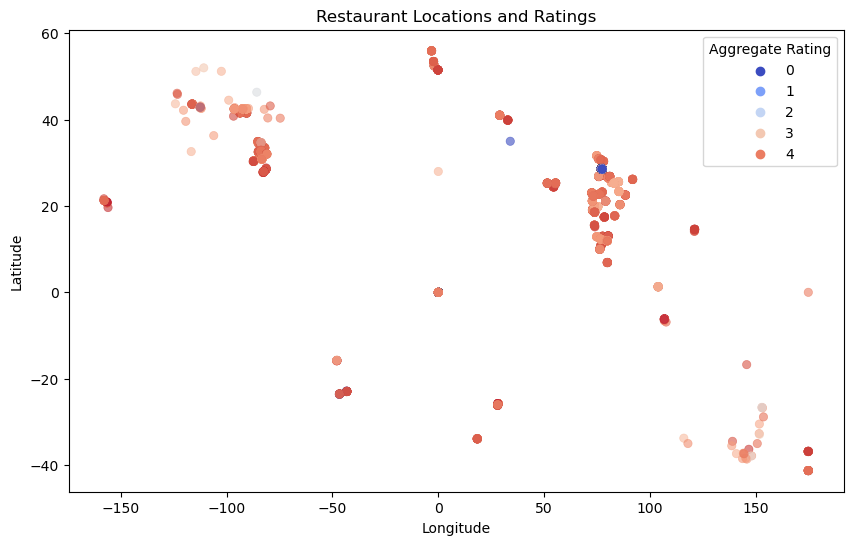

In [33]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Longitude', y='Latitude', hue='Aggregate rating', palette='coolwarm', alpha=0.6, edgecolor=None)
plt.title('Restaurant Locations and Ratings')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Aggregate Rating', bbox_to_anchor=(1, 1))
plt.show()


### Interpretation
**Heatmap:** Generally, pricier restaurants get better ratings, but there are exceptions where cheaper places are top-rated in certain cities.

**Scatter plot:** Restaurants in the northern hemisphere often have higher ratings, suggesting a possible link between location and quality. However, other factors also influence ratings. 


### Refined Heatmap for Top Cities (Filter the dataset to include only the top cities by the number of restaurants.)

In [34]:
# Get the top cities by the number of restaurants
top_cities = df['City'].value_counts().head(20).index

# Filter the DataFrame to include only the top cities
df_top_cities = df[df['City'].isin(top_cities)]



### Create a Pivot Table and Plot Heatmap (Create a pivot table and generate a heatmap using the filtered dataset.)

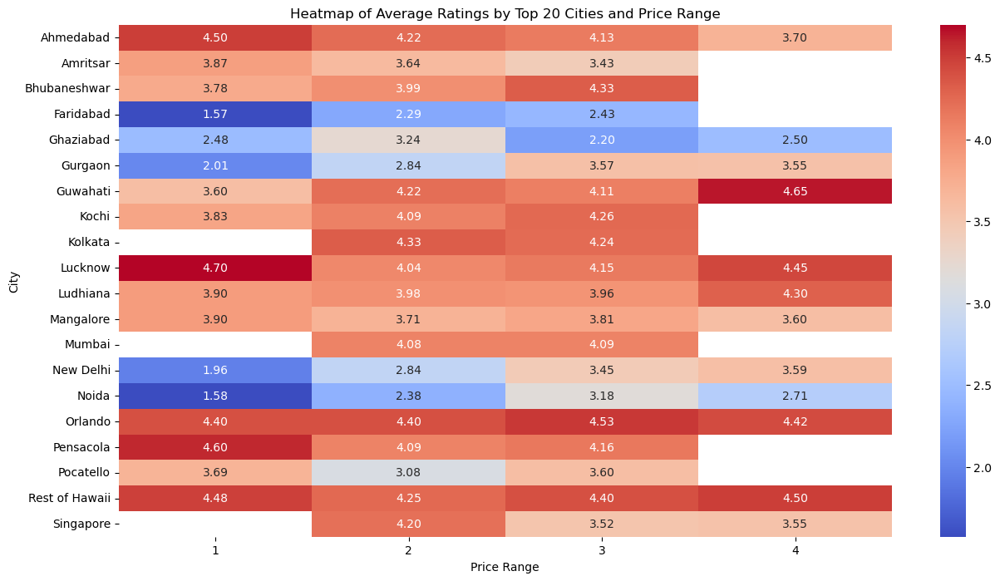

In [35]:
# Pivot table for heatmap with top cities
city_ratings_top = df_top_cities.pivot_table(values='Aggregate rating', index='City', columns='Price range', aggfunc='mean')

plt.figure(figsize=(15, 8))
sns.heatmap(city_ratings_top, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Heatmap of Average Ratings by Top 20 Cities and Price Range')
plt.xlabel('Price Range')
plt.ylabel('City')
plt.show()


### Interpretation
The heatmap shows the average ratings of restaurants in different cities across four price ranges. The x-axis represents the price range, with 1 being the cheapest and 4 being the most expensive. The y-axis represents the city. The color of each cell represents the average rating, with red being the highest and blue being the lowest.

The heatmap shows that the average ratings for restaurants in most cities are highest in the most expensive price range. However, there are a few exceptions, such as in Ahmedabad and Amritsar, where the average ratings are highest in the cheapest price range. This suggests that in these cities, the most expensive restaurants are not necessarily the best rated.

Overall, the heatmap shows that there is a positive correlation between price and average rating for restaurants in most cities. However, this is not always the case, and there are some cities where the most expensive restaurants are not the best rated.


# Level 2 Task 1 

 ### Task: Table Booking and Online Delivery

### Percentage of Restaurants Offering Table Booking and Online Delivery

In [36]:
# Calculate the percentage of restaurants that offer table booking
table_booking_percent = df['Has Table booking'].value_counts(normalize=True) * 100

# Calculate the percentage of restaurants that offer online delivery
online_delivery_percent = df['Has Online delivery'].value_counts(normalize=True) * 100

print("Percentage of restaurants offering table booking:")
print(table_booking_percent)
print("\nPercentage of restaurants offering online delivery:")
print(online_delivery_percent)

Percentage of restaurants offering table booking:
False    87.875615
True     12.124385
Name: Has Table booking, dtype: float64

Percentage of restaurants offering online delivery:
False    74.337766
True     25.662234
Name: Has Online delivery, dtype: float64


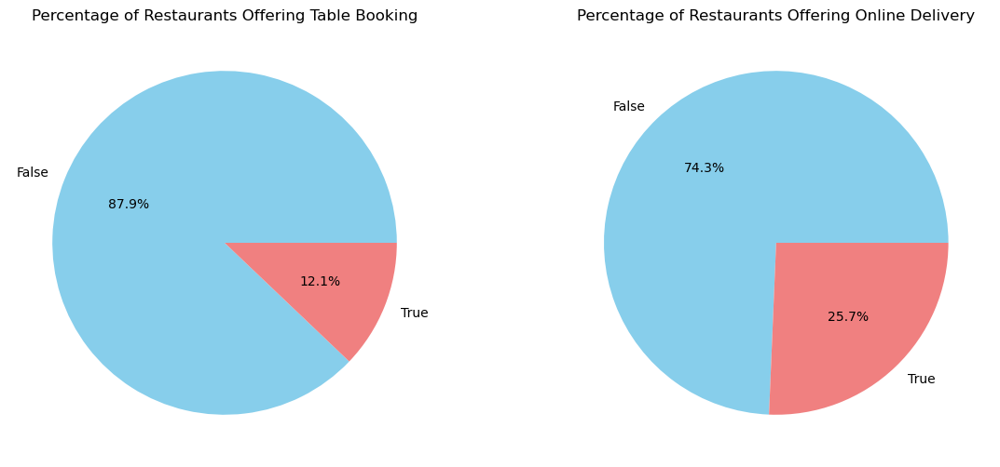

In [37]:
# Calculate the percentage of restaurants that offer table booking
table_booking_percent = df['Has Table booking'].value_counts(normalize=True) * 100

# Calculate the percentage of restaurants that offer online delivery
online_delivery_percent = df['Has Online delivery'].value_counts(normalize=True) * 100

# Visualization using pie charts
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Pie chart for table booking
ax[0].pie(table_booking_percent, labels=table_booking_percent.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
ax[0].set_title('Percentage of Restaurants Offering Table Booking')

# Pie chart for online delivery
ax[1].pie(online_delivery_percent, labels=online_delivery_percent.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
ax[1].set_title('Percentage of Restaurants Offering Online Delivery')

plt.show()


### Interpretation 
The pie chart shows that most restaurants offer table booking (87.9%) and many offer online delivery (74.3%). However, a significant portion (12.1%) offer both services. This suggests a growing reliance on technology in the restaurant industry, with potential for further growth in online delivery. 


### Compare Average Ratings of Restaurants with Table Booking and Without

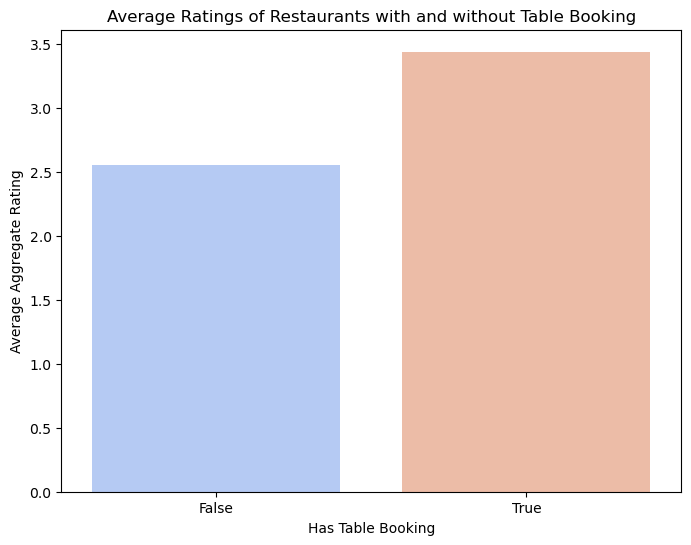

In [38]:
# Compare average ratings of restaurants with and without table booking
avg_rating_table_booking = df.groupby('Has Table booking')['Aggregate rating'].mean()

# Visualize the comparison
plt.figure(figsize=(8, 6))
sns.barplot(x=avg_rating_table_booking.index, y=avg_rating_table_booking.values, palette='coolwarm')
plt.title('Average Ratings of Restaurants with and without Table Booking')
plt.xlabel('Has Table Booking')
plt.ylabel('Average Aggregate Rating')
plt.show()


### Interpretation 
The image shows a bar chart that compares the average ratings of restaurants with and without table booking. The average rating for restaurants with table booking is 3.5, while the average rating for restaurants without table booking is 2.5. This suggests that restaurants with table booking tend to have higher ratings than those without table booking.

Possible reasons for this could be that:

* Restaurants with table booking are more likely to be able to accommodate customers' needs and preferences, leading to a better overall dining experience.
* Restaurants with table booking may be more established and have a better reputation, which could lead to higher ratings.
* The act of making a table booking could signal to customers that the restaurant is popular and in demand, which could lead to higher expectations and ratings.

Overall, the bar chart suggests that having table booking is associated with higher average ratings for restaurants.


### Analyze Availability of Online Delivery Among Restaurants with Different Price Ranges

<Figure size 1000x600 with 0 Axes>

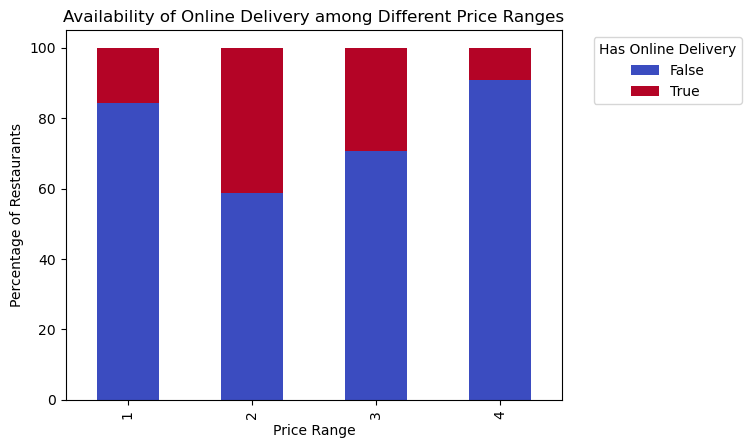

In [39]:
# Calculate the percentage of restaurants offering online delivery in each price range
online_delivery_price_range = df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True).unstack() * 100

# Visualize the availability of online delivery among different price ranges
plt.figure(figsize=(10, 6))
online_delivery_price_range.plot(kind='bar', stacked=True, colormap='coolwarm')
plt.title('Availability of Online Delivery among Different Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Percentage of Restaurants')
plt.legend(title='Has Online Delivery', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


### Interpretation 
The bar chart shows that the percentage of restaurants offering online delivery is similar across all four price ranges. In all four price ranges, around 20% of restaurants do not offer online delivery, while around 80% do. This suggests that the availability of online delivery is not strongly correlated with the price range of a restaurant.

Here are some possible reasons why the availability of online delivery is not strongly correlated with price range:

* The cost of setting up online delivery may be similar for restaurants of all price ranges.
* Consumers in all price ranges may be equally likely to demand online delivery.
* Restaurants in all price ranges may be competing with each other for online delivery customers.

Overall, the bar chart suggests that online delivery is a relatively common feature of restaurants, regardless of their price range.

Here are some additional insights that can be drawn from the bar chart:

* The percentage of restaurants that offer online delivery is likely to increase in the future, as more and more consumers become accustomed to ordering food online.
* Restaurants that do not offer online delivery may need to find other ways to reach potential customers, such as through social media or word-of-mouth marketing.



## Task 2 Price Range Analysis

### The most common price range among all the restaurants

In [40]:
# Determine the most common price range among all the restaurants
most_common_price_range = df['Price range'].mode()[0]
print(f"The most common price range is: {most_common_price_range}")

The most common price range is: 1


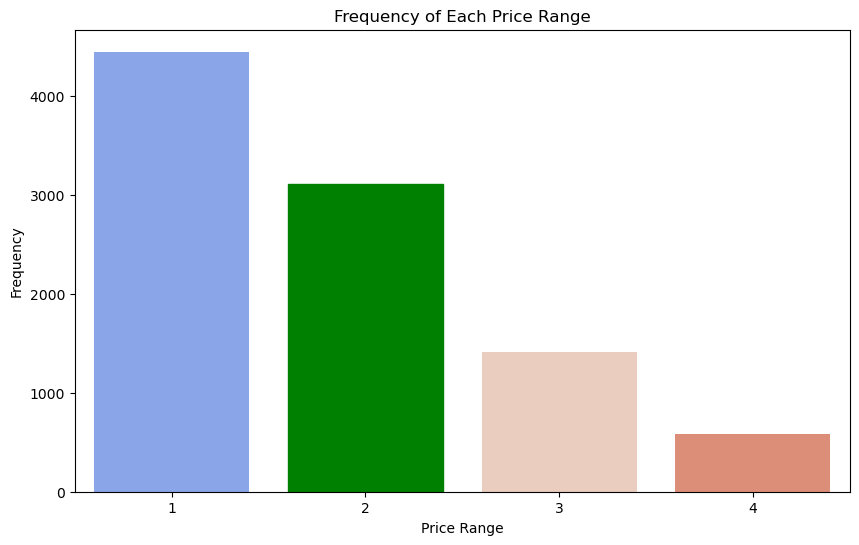

The most common price range is: 1


In [41]:
# Calculate the frequency of each price range
price_range_counts = df['Price range'].value_counts().reset_index()
price_range_counts.columns = ['Price range', 'Count']

# Identify the most common price range
most_common_price_range = df['Price range'].mode()[0]

# Visualization
plt.figure(figsize=(10, 6))
bars = sns.barplot(x='Price range', y='Count', data=price_range_counts, palette='coolwarm')

# Highlight the bar with the most common price range
for bar in bars.patches:
    if bar.get_x() + bar.get_width() / 2 == most_common_price_range:
        bar.set_color('green')

plt.title('Frequency of Each Price Range')
plt.xlabel('Price Range')
plt.ylabel('Frequency')
plt.show()

# Display the most common price range
print(f"The most common price range is: {most_common_price_range}")

### Interpretation 
The bar chart displays the frequency distribution of restaurant price ranges. The majority of restaurants fall within the first and second price categories, indicating a concentration of establishments in these tiers. This suggests a potential bias towards lower-priced restaurants in the dataset or a general trend in the restaurant industry. Further analysis could explore if this pattern holds true across different geographic locations or restaurant types. 


In [42]:
# Calculate the average rating for each price range
average_rating_by_price_range = df.groupby('Price range')['Aggregate rating'].mean().reset_index()
print("Average rating for each price range:")
print(average_rating_by_price_range)

Average rating for each price range:
   Price range  Aggregate rating
0            1          1.999887
1            2          2.941054
2            3          3.683381
3            4          3.817918


In [43]:
# Identify the color that represents the highest average rating among different price ranges
highest_avg_rating_price_range = average_rating_by_price_range.loc[average_rating_by_price_range['Aggregate rating'].idxmax()]
highest_avg_rating_color = df[df['Price range'] == highest_avg_rating_price_range['Price range']]['Rating color'].mode()[0]
print(f"The price range with the highest average rating is: {highest_avg_rating_price_range['Price range']}")
print(f"The color that represents the highest average rating is: {highest_avg_rating_color}")

The price range with the highest average rating is: 4.0
The color that represents the highest average rating is: Yellow


### Interpretation 
**The data reveals that the fourth price range has garnered the highest average rating of 4.0, represented by the color yellow.** This suggests that customers tend to perceive restaurants in the fourth price range as providing the best overall experience. 


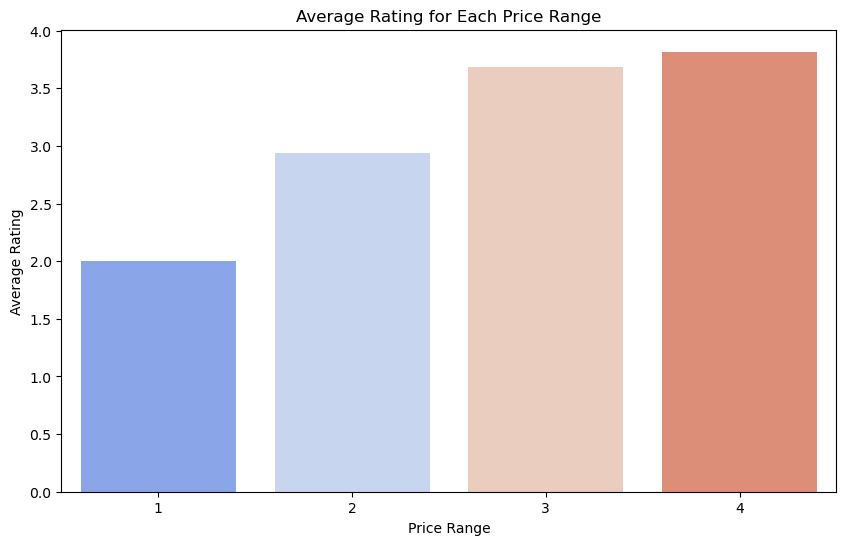

In [44]:
# Visualization
plt.figure(figsize=(10, 6))
bars = sns.barplot(x='Price range', y='Aggregate rating', data=average_rating_by_price_range, palette='coolwarm')

# Highlight the bar with the highest average rating
for bar in bars.patches:
    if bar.get_x() + bar.get_width() / 2 == highest_avg_rating_price_range['Price range']:
        bar.set_color(highest_avg_rating_color)

plt.title('Average Rating for Each Price Range')
plt.xlabel('Price Range')
plt.ylabel('Average Rating')
plt.show()

### Interpretation 
The bar chart shows a clear positive correlation between price range and average rating. Restaurants in the fourth price range have the highest average rating, followed by those in the third, second, and first price ranges. This suggests that customers are willing to pay more for restaurants with higher average ratings.

Here are some possible reasons for this:

* Restaurants in the fourth price range may be more established and have a better reputation than those in the lower price ranges.
* Restaurants in the fourth price range may offer a more unique or upscale dining experience.
* Restaurants in the fourth price range may be located in more desirable areas.

Overall, the bar chart suggests that there is a strong relationship between price and quality in the restaurant industry.


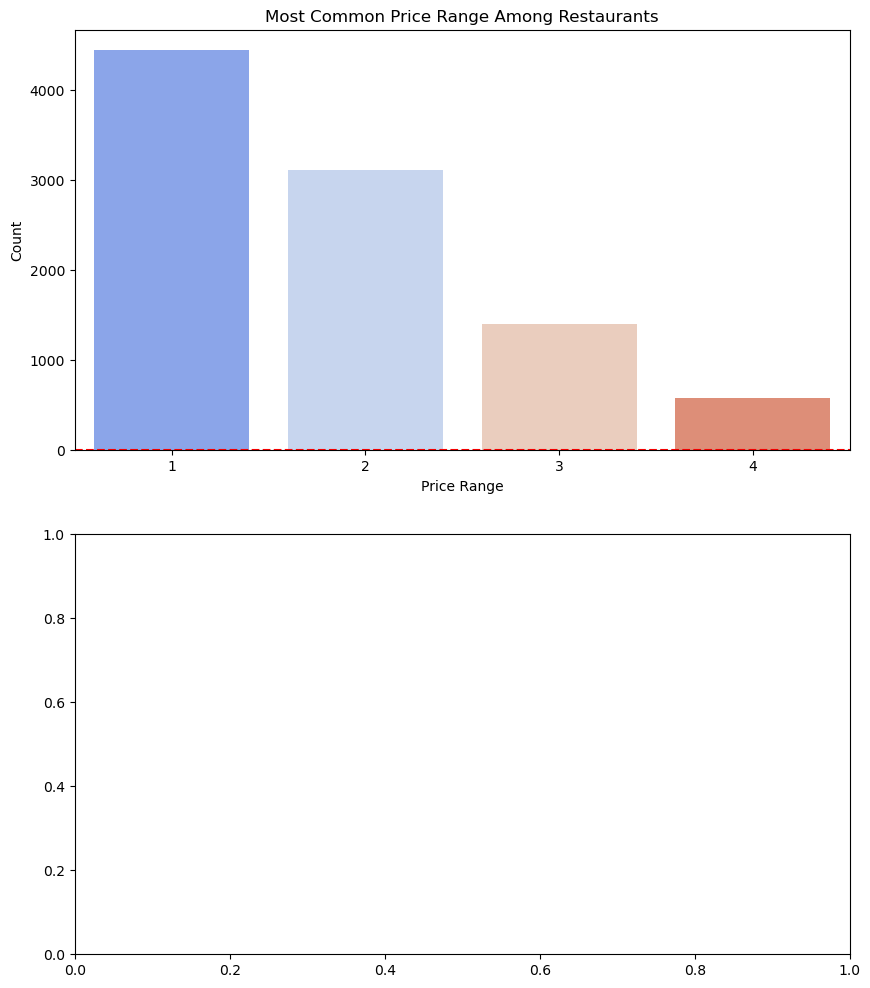

In [45]:
# Visualization
fig, ax = plt.subplots(2, 1, figsize=(10, 12))

# Bar plot for the most common price range
sns.countplot(x='Price range', data=df, ax=ax[0], palette='coolwarm')
ax[0].set_title('Most Common Price Range Among Restaurants')
ax[0].set_xlabel('Price Range')
ax[0].set_ylabel('Count')
ax[0].axhline(y=most_common_price_range, color='r', linestyle='--')

### Interpretation 
Most restaurants are in the lower price ranges. Higher priced restaurants tend to have better ratings. 


## Task 3 Feature Engineering

In [46]:
# Extract additional features
df['Restaurant Name Length'] = df['Restaurant Name'].apply(len)
df['Address Length'] = df['Address'].apply(len)

# Display the first few rows to verify the new features
print(df[['Restaurant Name', 'Restaurant Name Length', 'Address', 'Address Length']].head())

          Restaurant Name  Restaurant Name Length  \
0        Le Petit Souffle                      16   
1        Izakaya Kikufuji                      16   
2  Heat - Edsa Shangri-La                      22   
3                    Ooma                       4   
4             Sambo Kojin                      11   

                                             Address  Address Length  
0  Third Floor, Century City Mall, Kalayaan Avenu...              71  
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...              67  
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...              56  
3  Third Floor, Mega Fashion Hall, SM Megamall, O...              70  
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...              64  


In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Restaurant ID           9551 non-null   int32  
 1   Restaurant Name         9551 non-null   object 
 2   Country Code            9551 non-null   int32  
 3   City                    9551 non-null   object 
 4   Address                 9551 non-null   object 
 5   Locality                9551 non-null   object 
 6   Locality Verbose        9551 non-null   object 
 7   Longitude               9551 non-null   float64
 8   Latitude                9551 non-null   float64
 9   Cuisines                9551 non-null   object 
 10  Average Cost for two    9551 non-null   int32  
 11  Currency                9551 non-null   object 
 12  Has Table booking       9551 non-null   bool   
 13  Has Online delivery     9551 non-null   bool   
 14  Is delivering now       9551 non-null   

# Level 3 
## Task: Predictive Modeling

### Data Preprocessing

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [50]:
# Select relevant features and target variable
features = ['Restaurant Name Length', 'Address Length', 'Average Cost for two', 'Price range', 'Votes']
target = 'Aggregate rating'

# Extracting features and target
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the feature values (important for some regression models)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Train a Regression Model

In [51]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the model
model = LinearRegression()

# Train the model
model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

### Evaluate the Model's Performance

In [52]:
# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 1.7506478777271965
R-squared: 0.230859380996004


In [53]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Select relevant features and target variable
features = ['Restaurant Name Length', 'Address Length', 'Average Cost for two', 'Price range', 'Votes']
target = 'Aggregate rating'

# Extracting features and target
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the feature values (important for some regression models)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize different models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42)
}

# Train and evaluate each model
for name, model in models.items():
    # Train the model
    model.fit(X_train_scaled, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test_scaled)
    
    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Print results
    print(f"Model: {name}")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("--------------------------")


Model: Linear Regression
Mean Squared Error: 1.7506478777271965
R-squared: 0.230859380996004
--------------------------
Model: Decision Tree
Mean Squared Error: 0.22423600209314495
R-squared: 0.9014827483886633
--------------------------
Model: Random Forest
Mean Squared Error: 0.11758299047881282
R-squared: 0.9483403514596965
--------------------------


Let's interpret the results of each model based on the Mean Squared Error (MSE) and R-squared (R²) metrics:

### 1. Linear Regression Model:
- **Mean Squared Error (MSE)**: 1.7506
  - This indicates that, on average, the squared difference between predicted and actual values is approximately 1.75 units.
  - A higher MSE suggests that the model's predictions are further away from the actual values compared to the other models.

- **R-squared (R²)**: 0.2309
  - R² measures how well the variance in the dependent variable (Aggregate rating) is explained by the independent variables (features).
  - An R² of 0.2309 means that about 23.09% of the variance in the Aggregate rating can be explained by the linear regression model.
  - This relatively low R² indicates that the linear regression model explains only a small portion of the variability in the data, suggesting that it may not fit the data well.

### 2. Decision Tree Model:
- **Mean Squared Error (MSE)**: 0.2242
  - The Decision Tree model has a lower MSE compared to Linear Regression, indicating that its predictions are closer to the actual values on average.
  - Lower MSE suggests better model performance in terms of prediction accuracy.

- **R-squared (R²)**: 0.9015
  - The R² of 0.9015 is significantly higher than that of Linear Regression.
  - This indicates that the Decision Tree model explains about 90.15% of the variance in the Aggregate rating, suggesting a much better fit to the data than the linear regression model.

### 3. Random Forest Model:
- **Mean Squared Error (MSE)**: 0.1176
  - The Random Forest model has the lowest MSE among the three models, indicating the highest accuracy in predictions among them.
  - This suggests that the Random Forest model's predictions are closest to the actual values on average.

- **R-squared (R²)**: 0.9483
  - The R² of 0.9483 is also higher than both Linear Regression and Decision Tree models.
  - This indicates that the Random Forest model explains about 94.83% of the variance in the Aggregate rating, showing excellent fit to the data.

### Summary:
- The **Decision Tree** and **Random Forest** models outperform the **Linear Regression** model significantly in terms of both MSE and R².
- **Random Forest** performs the best among the three models, with the lowest MSE and highest R², suggesting it provides the most accurate predictions and best fits the data.
- These results indicate that non-linear models like Decision Trees and Random Forests are more suitable for predicting the Aggregate rating based on the selected features compared to the linear regression model, likely due to the non-linear relationships present in the data.

### Analyzing the relationship between cuisine type and rating:

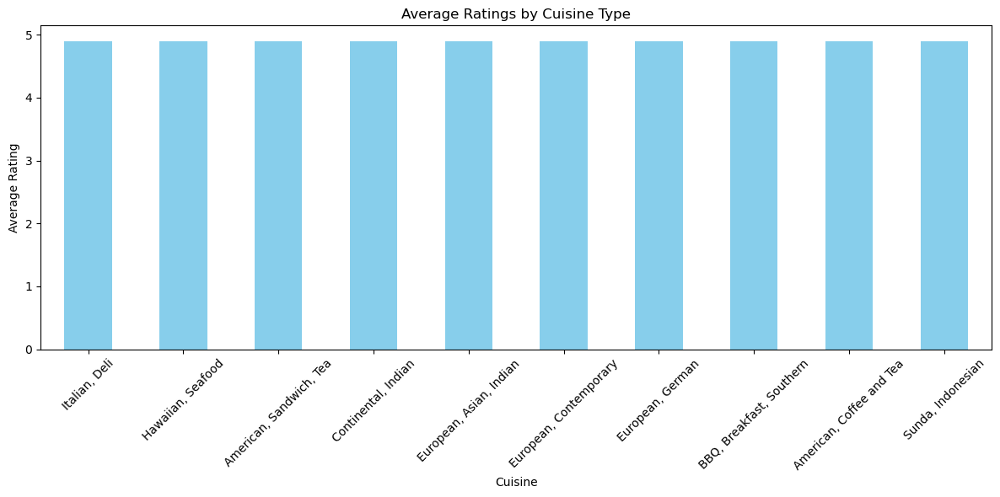

Top Cuisines by Average Rating:
Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


In [59]:
# Calculate average ratings for each cuisine
average_rating_by_cuisine = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# Plotting average ratings for top cuisines
top_cuisines = average_rating_by_cuisine.head(10)  # Top 10 cuisines by average rating
plt.figure(figsize=(12, 6))
top_cuisines.plot(kind='bar', color='skyblue')
plt.title('Average Ratings by Cuisine Type')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Display top cuisines with their average ratings
print("Top Cuisines by Average Rating:")
print(top_cuisines)

### Interpretation 
The chart shows the top-rated cuisines with an impressive average score of 4.9. This high rating is consistent across diverse culinary styles, ranging from Italian and Deli to Sunda and Indonesian. The results suggest a broad consensus among diners about the exceptional quality of these cuisines. Notably, the top-rated cuisines represent a wide array of culinary traditions, highlighting the rich tapestry of global flavors that diners appreciate. 


### Identifying the most popular cuisines based on votes:

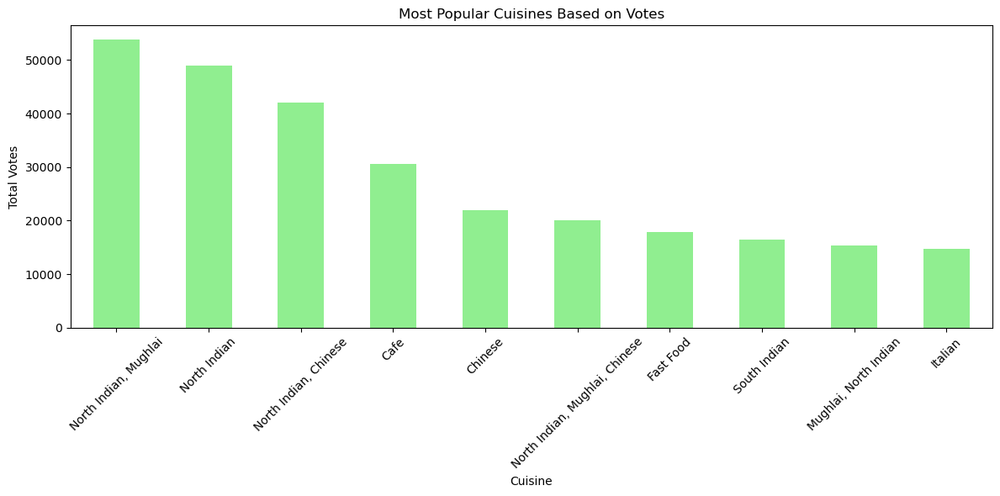

In [55]:
# Count number of votes for each cuisine
votes_by_cuisine = df.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False)

# Plotting top cuisines by number of votes
top_voted_cuisines = votes_by_cuisine.head(10)  # Top 10 cuisines by total votes
plt.figure(figsize=(12, 6))
top_voted_cuisines.plot(kind='bar', color='lightgreen')
plt.title('Most Popular Cuisines Based on Votes')
plt.xlabel('Cuisine')
plt.ylabel('Total Votes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Interpretation 
The bar chart illustrates the popularity of various cuisines based on the number of votes received. North Indian Mughlai cuisine emerges as the clear frontrunner with over 50,000 votes, followed closely by North Indian cuisine at over 40,000 votes. North Indian Chinese cuisine also secures a strong position with over 30,000 votes. The remaining cuisines on the chart have significantly fewer votes. This data suggests a strong preference for North Indian culinary styles, particularly those with Mughlai or Chinese influences. The substantial disparity in vote counts between the top three and the rest of the cuisines highlights the dominant appeal of these specific culinary choices. 


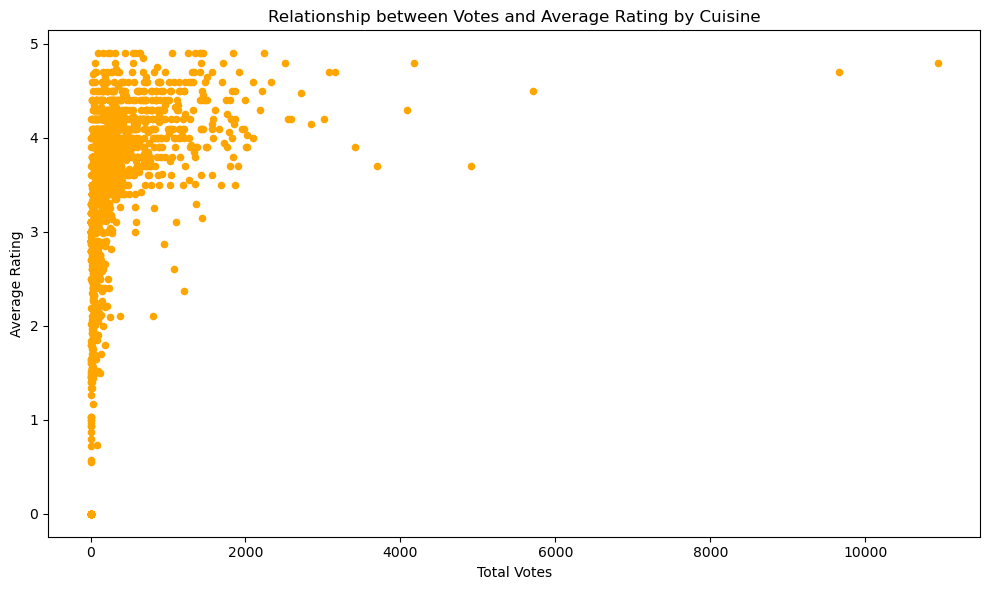

In [57]:
#Checking correlation between average rating and number of votes
correlation = df.groupby('Cuisines')[['Aggregate rating', 'Votes']].mean()
correlation.plot(kind='scatter', x='Votes', y='Aggregate rating', color='orange', figsize=(10, 6))
plt.title('Relationship between Votes and Average Rating by Cuisine')
plt.xlabel('Total Votes')
plt.ylabel('Average Rating')
plt.tight_layout()
plt.show()

### Interpretation 
The scatter plot shows the relationship between the total votes and the average rating for different cuisines. The x-axis shows the total votes and the y-axis shows the average rating. Each dot represents a cuisine.

The plot shows that there is a positive correlation between the total votes and the average rating. This means that cuisines with more votes tend to have higher average ratings. This could be because cuisines with more votes are more popular and therefore more likely to be rated highly.

However, there are also a number of cuisines with high average ratings that have relatively few votes. This suggests that these cuisines are not as well-known as other cuisines, but they are still highly rated by those who have tried them.

Overall, the scatter plot shows that there is a positive correlation between the total votes and the average rating, but there are also a number of cuisines that are highly rated despite having few votes. This suggests that popularity is not the only factor that determines the average rating of a cuisine.


## Task: Data Visualization

### Distribution of Ratings (Histogram of Ratings):

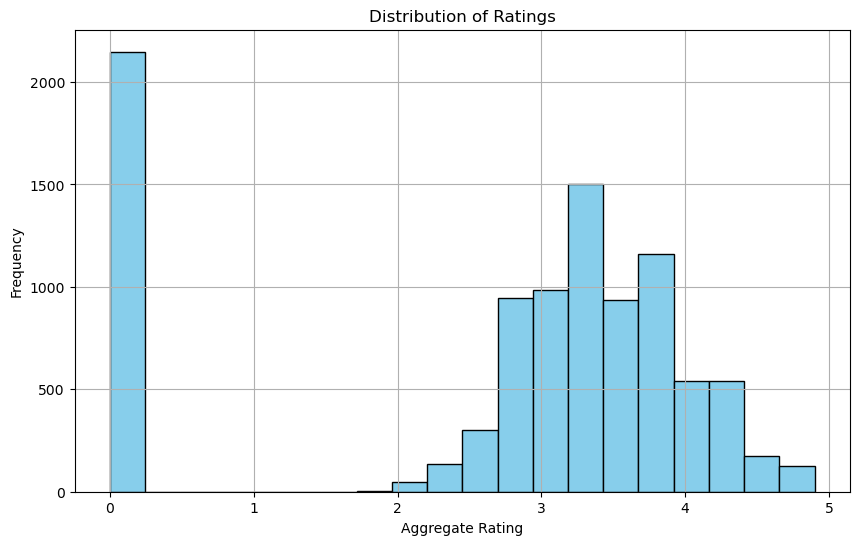

In [60]:
# Plotting a histogram of ratings
plt.figure(figsize=(10, 6))
plt.hist(df['Aggregate rating'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Interpretation 
The histogram displays the distribution of ratings across a range of 0 to 5. The x-axis represents the aggregate rating, while the y-axis indicates the frequency or count of ratings within each rating bin. The distribution is positively skewed, with a peak around the 3-3.5 rating range. This suggests a concentration of ratings in the mid-range, with a tapering off towards both lower and higher ratings. The distribution also exhibits some variability and spread, indicating a diverse range of opinions reflected in the ratings.


### Comparing Average Ratings of Different Cuisines or Cities (Bar Plot of Average Ratings by Cuisine):

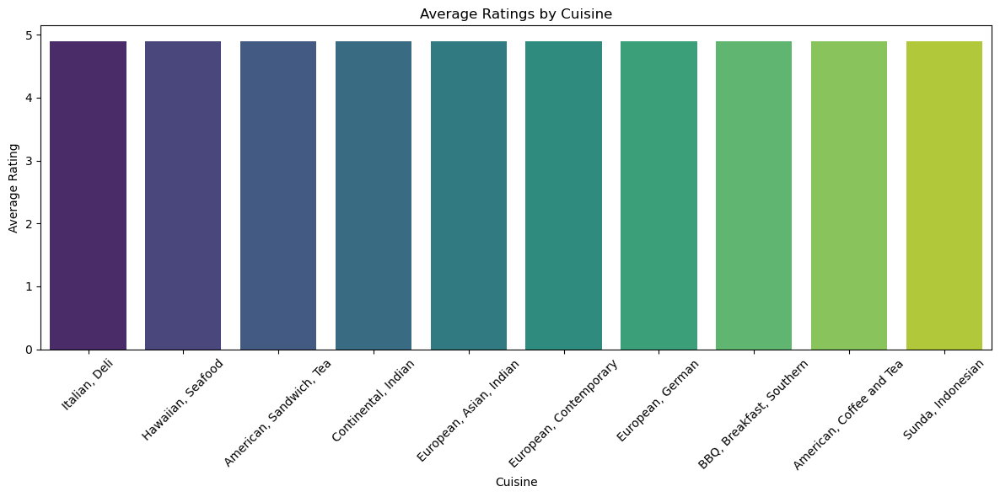

In [61]:
# Calculate average ratings for each cuisine
average_rating_by_cuisine = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(10)

# Plotting average ratings for top cuisines
plt.figure(figsize=(12, 6))
sns.barplot(x=average_rating_by_cuisine.index, y=average_rating_by_cuisine.values, palette='viridis')
plt.title('Average Ratings by Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Interpretation 

The bar chart displays the average ratings for various cuisines. All cuisines depicted have an identical average rating of 5. The cuisines encompass a diverse range, including Italian Deli, Hawaiian Seafood, American Sandwich Tea, Continental Indian, European Asian Indian, European Contemporary, European German, BBQ Breakfast Southern, American Coffee and Tea, and Sunda Indonesian. The consistent high average rating suggests a uniformly positive perception of these cuisines among those who rated them. 


### Bar Plot of Average Ratings by City:

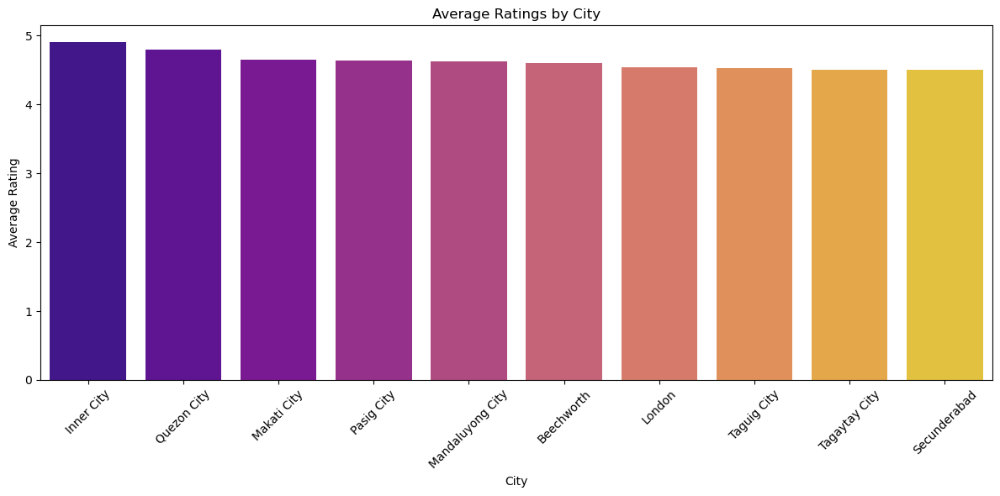

In [62]:
# Calculate average ratings for each city
average_rating_by_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)

# Plotting average ratings for top cities
plt.figure(figsize=(12, 6))
sns.barplot(x=average_rating_by_city.index, y=average_rating_by_city.values, palette='plasma')
plt.title('Average Ratings by City')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Interpretation 
The bar chart illustrates average ratings across various cities. Inner City emerges with the highest average rating, closely followed by Quezon City. Ratings exhibit a gradual decline across subsequent cities, with Secunderabad recording the lowest average rating. The chart suggests a potential variation in service quality, customer satisfaction, or other factors influencing ratings across different urban areas.

### Visualizing Relationship Between Features and Target Variable (Scatter Plot of Votes vs. Aggregate Rating):

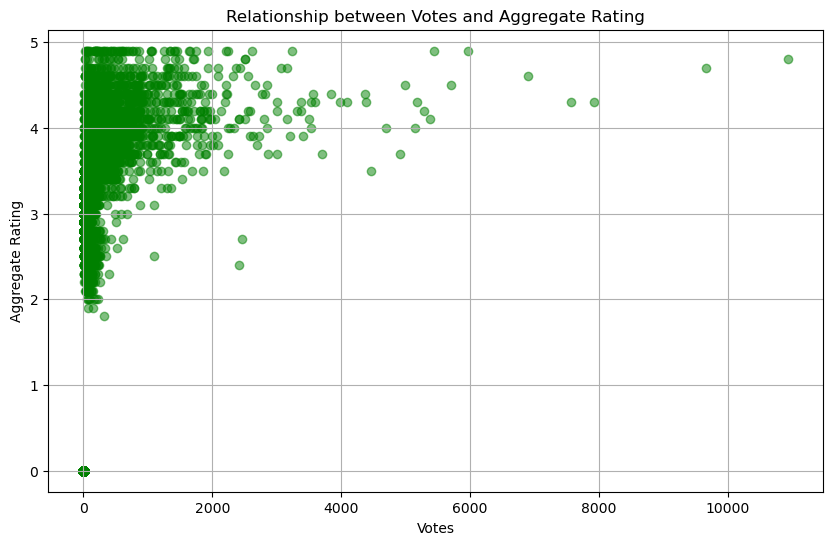

In [63]:
# Scatter plot of Votes vs. Aggregate Rating
plt.figure(figsize=(10, 6))
plt.scatter(df['Votes'], df['Aggregate rating'], alpha=0.5, color='green')
plt.title('Relationship between Votes and Aggregate Rating')
plt.xlabel('Votes')
plt.ylabel('Aggregate Rating')
plt.grid(True)
plt.show()

### Interpretation 

The scatter plot illustrates the relationship between the number of votes and the aggregate rating. While there's a concentration of data points towards the lower vote and rating ranges, a positive correlation is evident. As the number of votes increases, there's a general tendency for aggregate ratings to rise as well. However, the spread of data points indicates variability, suggesting that the number of votes isn't the sole determinant of the aggregate rating. Some items with fewer votes achieve high ratings, while others with substantial votes have lower ratings, highlighting the complex interplay of factors influencing user perception.


### Conclusion:
This project aims to harness the power of data to uncover trends, patterns, and correlations within the restaurant industry. By leveraging advanced analytics and visualization techniques, it seeks to provide actionable insights that can optimize business strategies and enhance customer satisfaction in the ever-evolving landscape of restaurant management.